In [24]:
import os
import cv2
import glob
import yaml
import random
import pathlib
import numpy as np
import pandas as pd
from PIL import Image
import seaborn as sns
from tqdm import tqdm
from ultralytics import YOLO
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from tqdm.notebook import trange, tqdm
from IPython.display import Image, Video
from IPython.display import Image, display
from sklearn.metrics import precision_score, recall_score
!wandb disabled
import warnings
warnings.filterwarnings('ignore')

W&B disabled.


In [25]:
train_path = r'C:\Users\Kalivemula Rajendra\Desktop\chandini\archive\VehiclesDetectionDataset\train'
val_path = r'C:\Users\Kalivemula Rajendra\Desktop\chandini\archive\VehiclesDetectionDataset\valid'
test_path = r'C:\Users\Kalivemula Rajendra\Desktop\chandini\archive\VehiclesDetectionDataset\test'

yaml_content = f"""
test: {test_path}
train: {train_path}
val: {val_path}

nc: 5  # Number of classes
names: ['Ambulance', 'Bus', 'Car', 'Motorcycle', 'Truck']
"""
output_path = 'data.yaml'
with open(output_path, 'w') as file:
    file.write(yaml_content)
color_code = "\033[38;2;163;196;243m" 
reset_code = "\033[0m"
print(f"{color_code}YAML file has been saved to {output_path}{reset_code}")

YAML file has been saved to data.yaml


In [26]:
output_path = 'data.yaml'
with open(output_path, 'r') as file:
    data = yaml.safe_load(file)
class_names = data['names']
print(f"{color_code}Class Names:{reset_code} {class_names}")

Class Names: ['Ambulance', 'Bus', 'Car', 'Motorcycle', 'Truck']


In [30]:
import os
import random
from PIL import Image
images_folder = r'C:\Users\Kalivemula Rajendra\Desktop\chandini\archive\VehiclesDetectionDataset\train\images'
image_files = [f for f in os.listdir(images_folder) if f.endswith(('.jpg', '.png', '.jpeg'))]
random_image = random.choice(image_files)
random_image_path = os.path.join(images_folder, random_image)
image = Image.open(random_image_path)
image_size = image.size
image_mode = image.mode
num_channels = image.layers if hasattr(image, 'layers') else len(image.getbands())
print(f"Random Image: {random_image}")
print(f"Image Size: {image_size}")
print(f"Image Mode (Channels): {image_mode}")
print(f"Number of Channels: {num_channels}")

Random Image: 6fcb072467002402_jpg.rf.cee5351b61d58e01bab7f4f3ede4dbd2.jpg
Image Size: (416, 416)
Image Mode (Channels): RGB
Number of Channels: 3



image 1/1 C:\Users\Kalivemula Rajendra\Desktop\chandini\archive\VehiclesDetectionDataset\train\images\df7ae805d8d405f6_jpg.rf.1f417ff6ff03aab38704f4599e7c38f1.jpg: 416x416 1 person, 2 trucks, 6.3ms
Speed: 6.6ms preprocess, 6.3ms inference, 384.6ms postprocess per image at shape (1, 3, 416, 416)


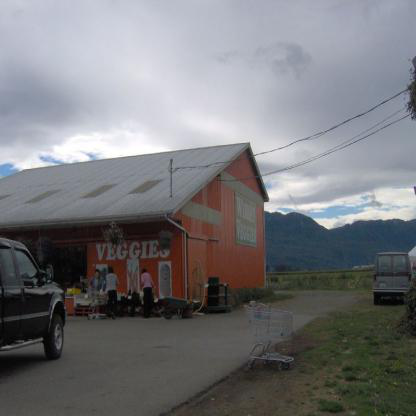

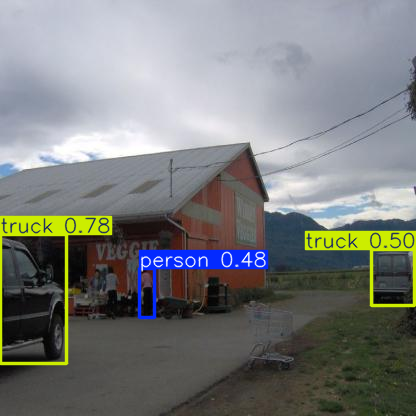


image 1/1 C:\Users\Kalivemula Rajendra\Desktop\chandini\archive\VehiclesDetectionDataset\train\images\7eecf7ff2aaa158b_jpg.rf.3eHXD0wrKKiC21j4psJI.jpg: 416x416 2 trucks, 10.0ms
Speed: 1.3ms preprocess, 10.0ms inference, 2.8ms postprocess per image at shape (1, 3, 416, 416)


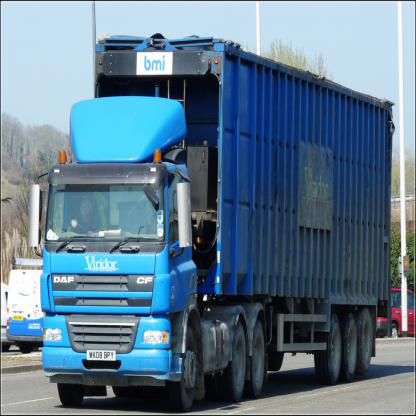

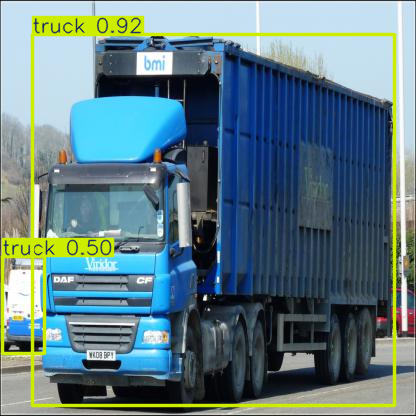


image 1/1 C:\Users\Kalivemula Rajendra\Desktop\chandini\archive\VehiclesDetectionDataset\train\images\068868f40fb6dbec_jpg.rf.TuNx4cAV28rilGbgRwVh.jpg: 416x416 1 person, 5 cars, 4 trucks, 18.6ms
Speed: 0.9ms preprocess, 18.6ms inference, 3.7ms postprocess per image at shape (1, 3, 416, 416)


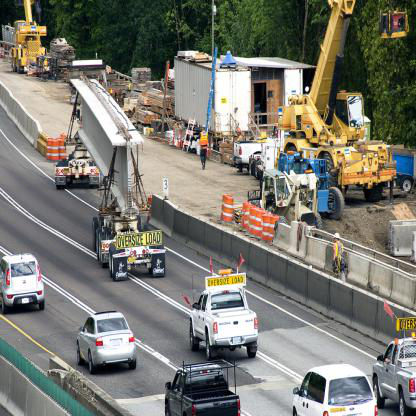

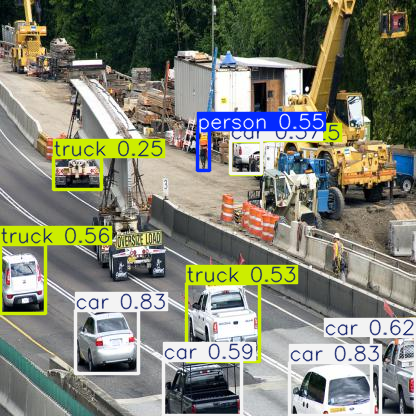


image 1/1 C:\Users\Kalivemula Rajendra\Desktop\chandini\archive\VehiclesDetectionDataset\train\images\447c9ff274fab842_jpg.rf.Yzz1UWLTvLeMwXBZTtat.jpg: 416x416 2 buss, 1 truck, 8.8ms
Speed: 1.2ms preprocess, 8.8ms inference, 3.7ms postprocess per image at shape (1, 3, 416, 416)


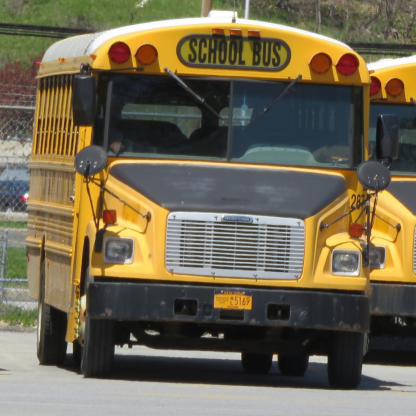

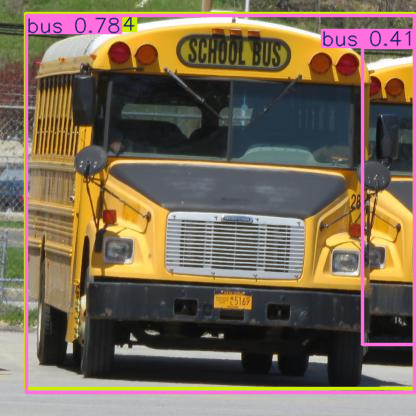


image 1/1 C:\Users\Kalivemula Rajendra\Desktop\chandini\archive\VehiclesDetectionDataset\train\images\9c5cf4fed30054f2_jpg.rf.55e1c3dc00ad0ca230085fd1747b61f6.jpg: 416x416 1 person, 1 bus, 2 trucks, 11.4ms
Speed: 1.3ms preprocess, 11.4ms inference, 2.2ms postprocess per image at shape (1, 3, 416, 416)


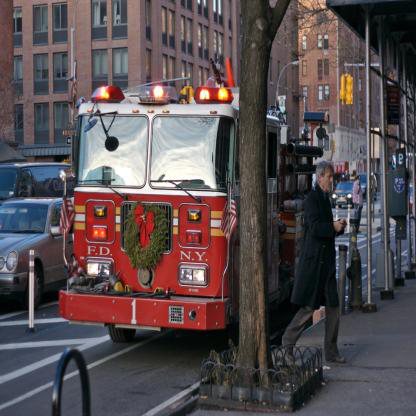

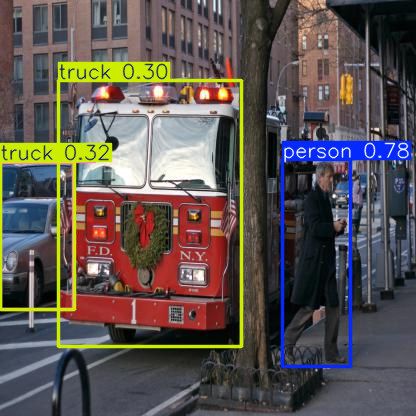


image 1/1 C:\Users\Kalivemula Rajendra\Desktop\chandini\archive\VehiclesDetectionDataset\train\images\90ddce2c65dec1cf_jpg.rf.8404f3d3f201b1305b44aaa0d5a507b2.jpg: 416x416 1 car, 8.5ms
Speed: 1.0ms preprocess, 8.5ms inference, 4.0ms postprocess per image at shape (1, 3, 416, 416)


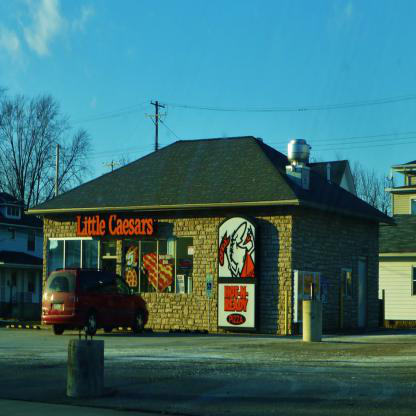

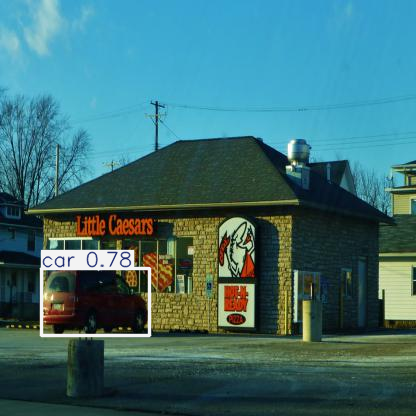


image 1/1 C:\Users\Kalivemula Rajendra\Desktop\chandini\archive\VehiclesDetectionDataset\train\images\7845ed5a26cb9fd4_jpg.rf.4774c33772ba8a86565de0d4ab90a688.jpg: 416x416 6 cars, 9.7ms
Speed: 0.7ms preprocess, 9.7ms inference, 2.5ms postprocess per image at shape (1, 3, 416, 416)


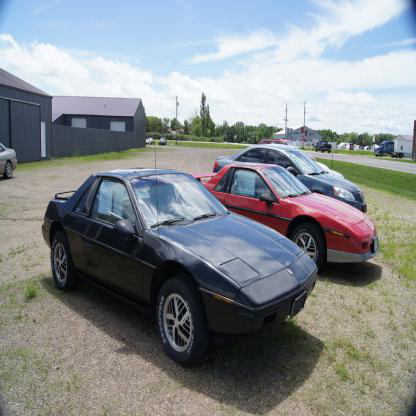

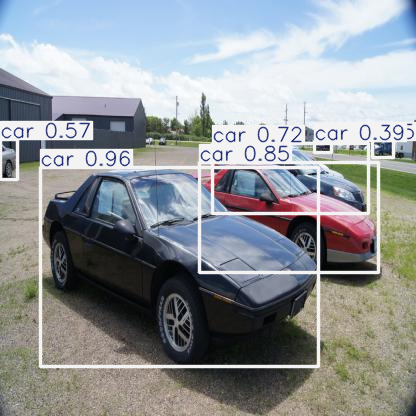


image 1/1 C:\Users\Kalivemula Rajendra\Desktop\chandini\archive\VehiclesDetectionDataset\train\images\ea87ffff22c14e7a_jpg.rf.a3617e737c1eab6b5b7473e03c0e98cf.jpg: 416x416 1 person, 2 trucks, 9.6ms
Speed: 0.8ms preprocess, 9.6ms inference, 2.3ms postprocess per image at shape (1, 3, 416, 416)


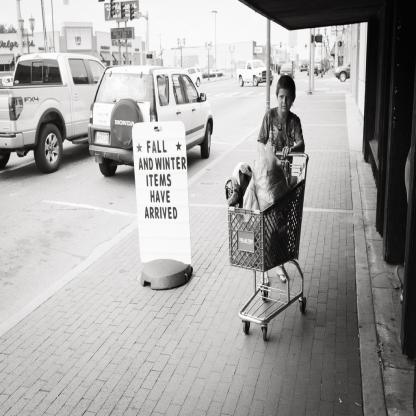

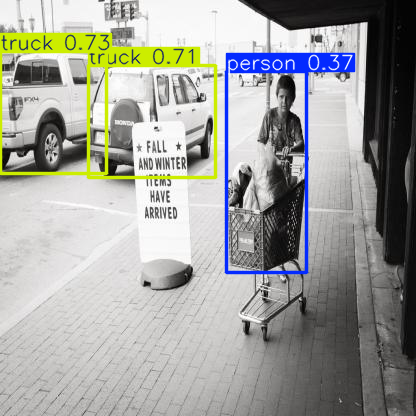


image 1/1 C:\Users\Kalivemula Rajendra\Desktop\chandini\archive\VehiclesDetectionDataset\train\images\f71f6c1a323b6fa5_jpg.rf.2Vsn4Ov1CQDuccBqnRc3.jpg: 416x416 1 person, 1 car, 1 motorcycle, 1 truck, 9.9ms
Speed: 0.7ms preprocess, 9.9ms inference, 2.3ms postprocess per image at shape (1, 3, 416, 416)


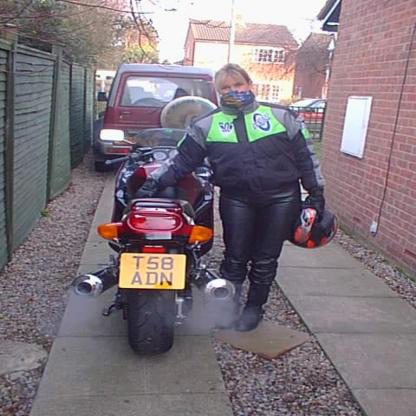

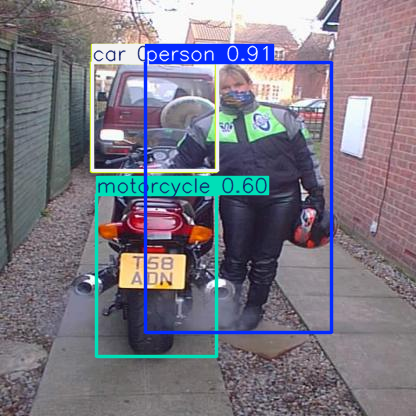


image 1/1 C:\Users\Kalivemula Rajendra\Desktop\chandini\archive\VehiclesDetectionDataset\train\images\547c1b1416d7b64d_jpg.rf.bc4e7a779ac5ccc58c74ce55a1218322.jpg: 416x416 1 truck, 9.5ms
Speed: 0.9ms preprocess, 9.5ms inference, 1.9ms postprocess per image at shape (1, 3, 416, 416)


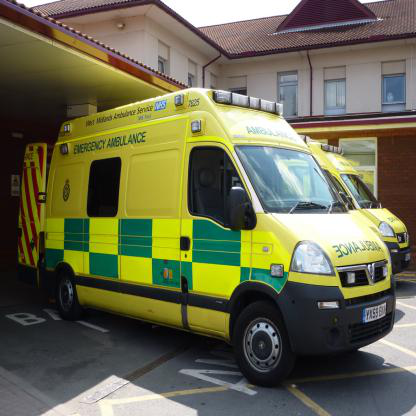

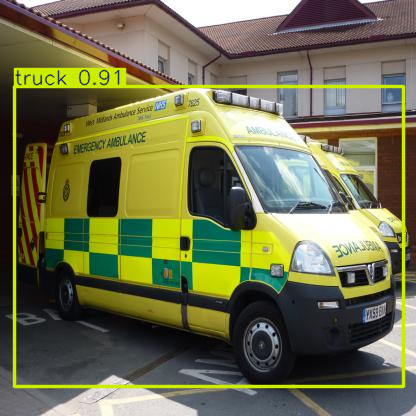


image 1/1 C:\Users\Kalivemula Rajendra\Desktop\chandini\archive\VehiclesDetectionDataset\train\images\8e1ded483cacc175_jpg.rf.5652fefc820cfc42d237b3a5b932cb46.jpg: 416x416 1 person, 4 cars, 1 truck, 14.4ms
Speed: 0.8ms preprocess, 14.4ms inference, 3.2ms postprocess per image at shape (1, 3, 416, 416)


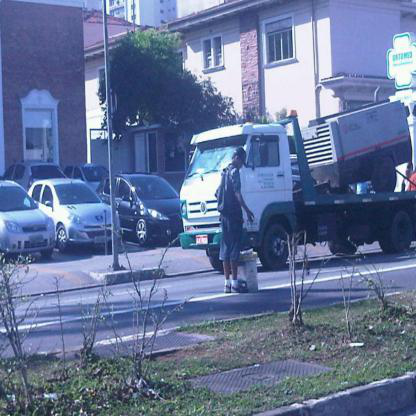

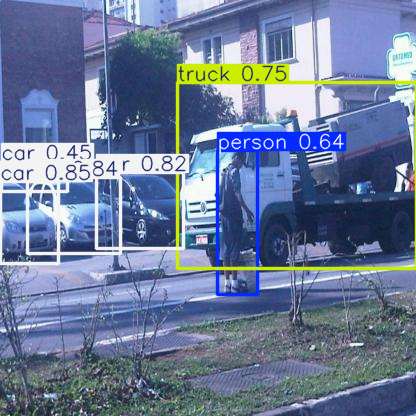


image 1/1 C:\Users\Kalivemula Rajendra\Desktop\chandini\archive\VehiclesDetectionDataset\train\images\65e29a38268145a8_jpg.rf.10c30d6ccb1692243ca4eb7d450751a3.jpg: 416x416 1 person, 1 car, 1 truck, 8.9ms
Speed: 0.8ms preprocess, 8.9ms inference, 2.1ms postprocess per image at shape (1, 3, 416, 416)


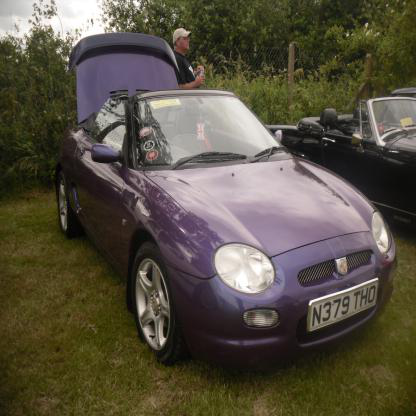

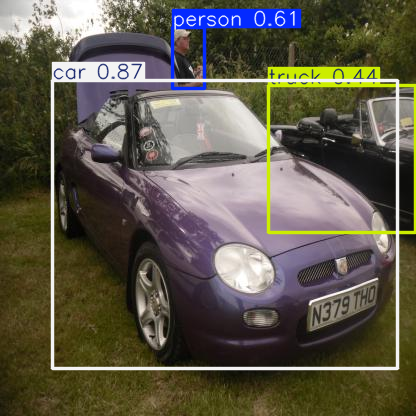


image 1/1 C:\Users\Kalivemula Rajendra\Desktop\chandini\archive\VehiclesDetectionDataset\train\images\b2a36196721315df_jpg.rf.j31VteivPpcqRzlcONlb.jpg: 416x416 3 cars, 9.6ms
Speed: 1.0ms preprocess, 9.6ms inference, 2.1ms postprocess per image at shape (1, 3, 416, 416)


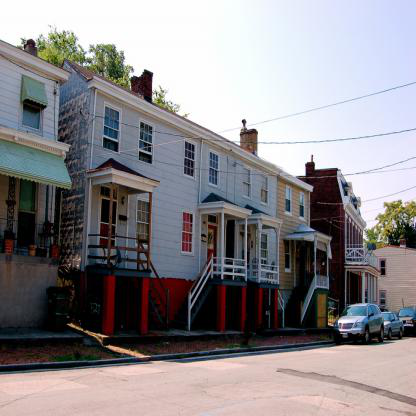

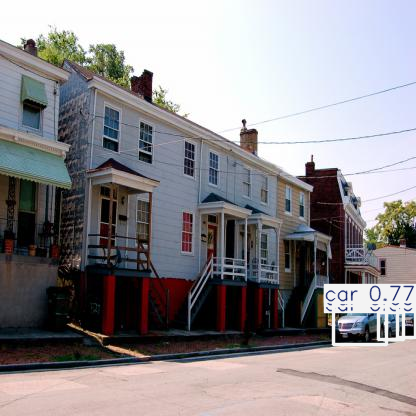


image 1/1 C:\Users\Kalivemula Rajendra\Desktop\chandini\archive\VehiclesDetectionDataset\train\images\3848f783b1a99a6e_jpg.rf.9593d9c8f6e377bd928576928803a31e.jpg: 416x416 1 truck, 9.0ms
Speed: 0.8ms preprocess, 9.0ms inference, 2.3ms postprocess per image at shape (1, 3, 416, 416)


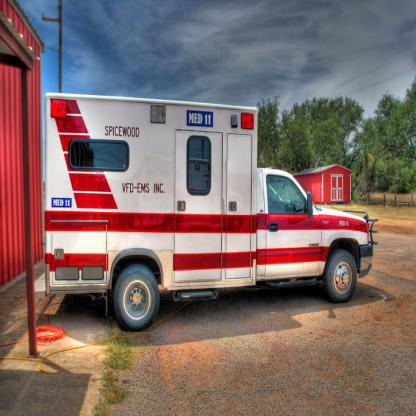

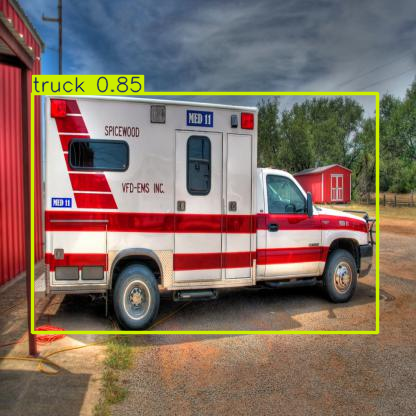


image 1/1 C:\Users\Kalivemula Rajendra\Desktop\chandini\archive\VehiclesDetectionDataset\train\images\99d905d40b37c9a6_jpg.rf.c392d37141642fbceb40f6a855e46cfe.jpg: 416x416 1 car, 10.1ms
Speed: 0.8ms preprocess, 10.1ms inference, 2.2ms postprocess per image at shape (1, 3, 416, 416)


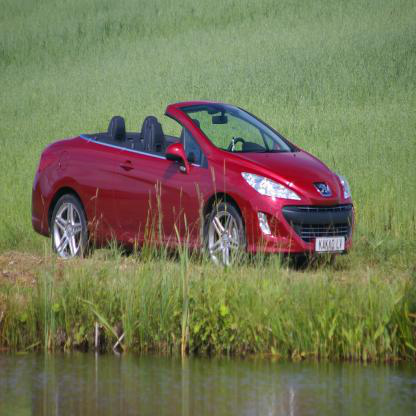

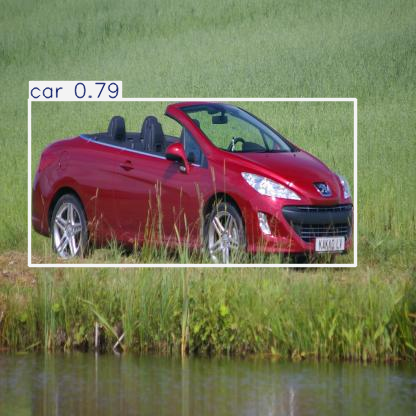


image 1/1 C:\Users\Kalivemula Rajendra\Desktop\chandini\archive\VehiclesDetectionDataset\train\images\230823605bf60c37_jpg.rf.d4caabb0edfc6a41a72b1c590b868f47.jpg: 416x416 1 bus, 1 truck, 10.4ms
Speed: 0.9ms preprocess, 10.4ms inference, 2.6ms postprocess per image at shape (1, 3, 416, 416)


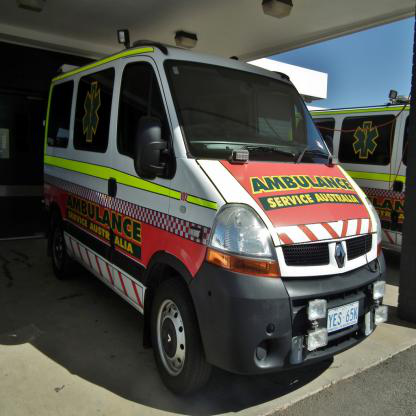

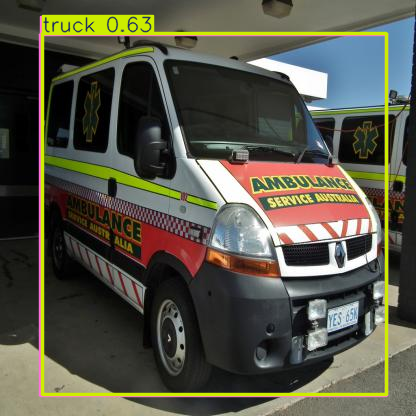


image 1/1 C:\Users\Kalivemula Rajendra\Desktop\chandini\archive\VehiclesDetectionDataset\train\images\50254d0ed7df5e01_jpg.rf.96644ffe356cf46061ab2eccac3b946c.jpg: 416x416 1 person, 1 car, 9.3ms
Speed: 0.9ms preprocess, 9.3ms inference, 2.3ms postprocess per image at shape (1, 3, 416, 416)


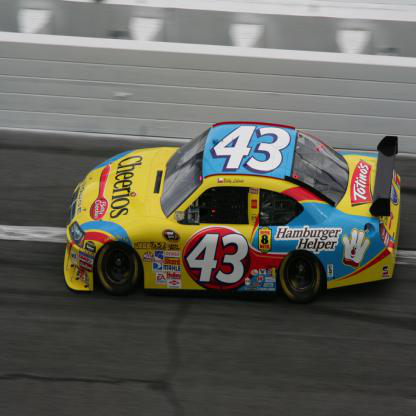

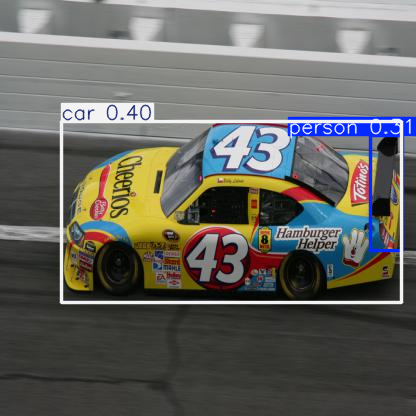


image 1/1 C:\Users\Kalivemula Rajendra\Desktop\chandini\archive\VehiclesDetectionDataset\train\images\230823605bf60c37_jpg.rf.w5PtSkESUfxwB6p4RVUy.jpg: 416x416 1 bus, 1 truck, 9.9ms
Speed: 1.3ms preprocess, 9.9ms inference, 2.6ms postprocess per image at shape (1, 3, 416, 416)


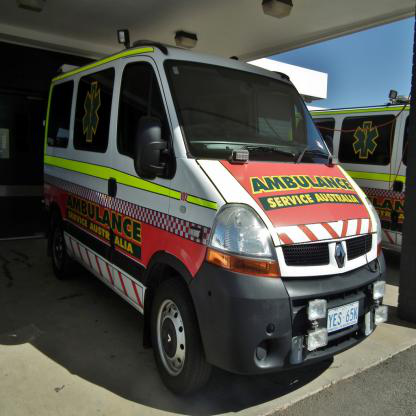

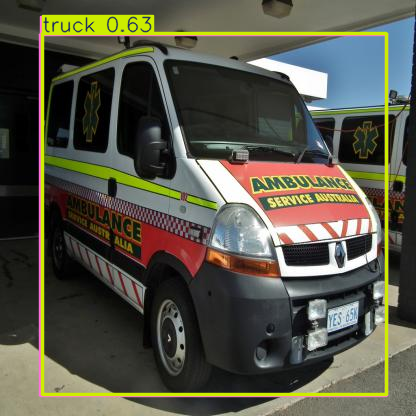


image 1/1 C:\Users\Kalivemula Rajendra\Desktop\chandini\archive\VehiclesDetectionDataset\train\images\dc904e3df7290455_jpg.rf.MQYiSgKz6ZVyX4JtlVTQ.jpg: 416x416 1 truck, 9.8ms
Speed: 0.8ms preprocess, 9.8ms inference, 4.6ms postprocess per image at shape (1, 3, 416, 416)


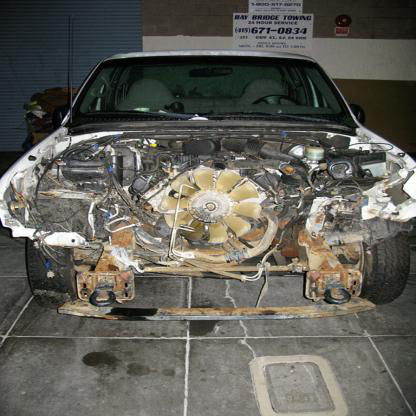

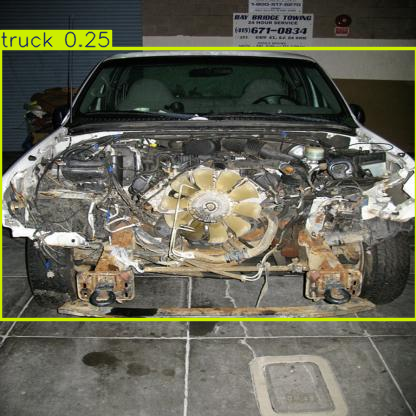


image 1/1 C:\Users\Kalivemula Rajendra\Desktop\chandini\archive\VehiclesDetectionDataset\train\images\1781ceeba365928b_jpg.rf.BeJOJjojkNZXLd3W7yur.jpg: 416x416 3 cars, 2 buss, 11.8ms
Speed: 0.9ms preprocess, 11.8ms inference, 1.9ms postprocess per image at shape (1, 3, 416, 416)


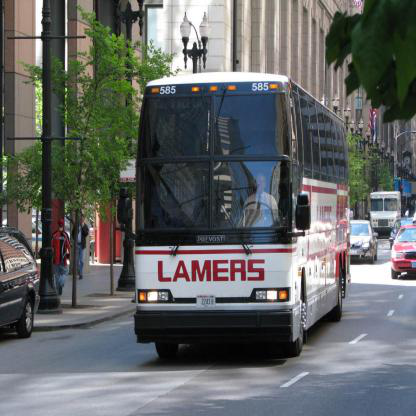

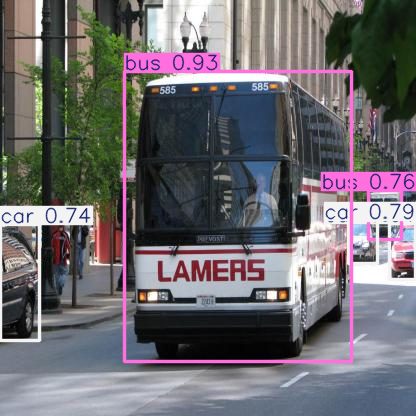

In [33]:
images_folder = r'C:\Users\Kalivemula Rajendra\Desktop\chandini\archive\VehiclesDetectionDataset\train\images'
image_files = [f for f in os.listdir(images_folder) if f.endswith(('.jpg', '.png', '.jpeg'))]
random_images = random.sample(image_files, 20)
model = YOLO("yolov8n.pt")
for image_file in random_images:
    image_path = os.path.join(images_folder, image_file)
    result_predict = model.predict(source=image_path, imgsz=(416))
    original_image = Image.open(image_path)
    display(original_image)
    for result in result_predict:
        plot = result.plot()
        plot = cv2.cvtColor(plot, cv2.COLOR_BGR2RGB)
        display(Image.fromarray(plot))

In [34]:
finalmodel = YOLO('yolov8n.yaml').load('yolov8n.pt')  
Result_finalmodel = finalmodel.train(data=r"C:\Users\Kalivemula Rajendra\Desktop\chandini\archive\VehiclesDetectionDataset\dataset.yaml",epochs=100, imgsz=416, batch=16, lr0=0.001, dropout=0.1, device=0)

Transferred 355/355 items from pretrained weights
New https://pypi.org/project/ultralytics/8.3.159 available  Update with 'pip install -U ultralytics'
Ultralytics 8.3.156  Python-3.9.21 torch-2.5.1 CUDA:0 (NVIDIA GeForce RTX 4060 Laptop GPU, 8188MiB)
engine\trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=C:\Users\Kalivemula Rajendra\Desktop\chandini\archive\VehiclesDetectionDataset\dataset.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.1, dynamic=False, embed=None, epochs=100, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=416, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.001, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=

100%|██████████| 5.35M/5.35M [00:01<00:00, 4.63MB/s]


AMP: checks passed 
train: Fast image access  (ping: 0.10.0 ms, read: 81.5119.8 MB/s, size: 29.7 KB)


train: Scanning C:\Users\Kalivemula Rajendra\Desktop\chandini\archive\VehiclesDetectionDataset\train\labels... 878 images, 0 backgrounds, 0 corrupt: 100%|██████████| 878/878 [00:00<00:00, 900.88it/s]

train: New cache created: C:\Users\Kalivemula Rajendra\Desktop\chandini\archive\VehiclesDetectionDataset\train\labels.cache


val: Fast image access  (ping: 0.30.1 ms, read: 2.70.8 MB/s, size: 33.0 KB)


val: Scanning C:\Users\Kalivemula Rajendra\Desktop\chandini\archive\VehiclesDetectionDataset\valid\labels... 250 images, 0 backgrounds, 0 corrupt: 100%|██████████| 250/250 [00:00<00:00, 487.98it/s]

val: New cache created: C:\Users\Kalivemula Rajendra\Desktop\chandini\archive\VehiclesDetectionDataset\valid\labels.cache


Plotting labels to runs\detect\train\labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.001' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.001111, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
Image sizes 416 train, 416 val
Using 8 dataloader workers
Logging results to runs\detect\train
Starting training for 100 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      1/100     0.938G      1.115      2.776      1.299         50        416: 100%|██████████| 55/55 [00:09<00:00,  5.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  4.22it/s]

                   all        250        454      0.494        0.2      0.308      0.206



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      2/100      1.07G      1.178      2.075      1.332         50        416: 100%|██████████| 55/55 [00:07<00:00,  7.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  5.04it/s]

                   all        250        454      0.377       0.44      0.334      0.211



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      3/100      1.07G      1.197      1.932       1.32         52        416: 100%|██████████| 55/55 [00:07<00:00,  7.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  4.88it/s]

                   all        250        454      0.375      0.408      0.322      0.184



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      4/100      1.08G      1.192      1.892      1.328         54        416: 100%|██████████| 55/55 [00:06<00:00,  8.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  5.08it/s]

                   all        250        454      0.398      0.418      0.318      0.194



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      5/100      1.08G      1.209      1.857      1.356         38        416: 100%|██████████| 55/55 [00:07<00:00,  7.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  4.17it/s]

                   all        250        454      0.279      0.354      0.293      0.197



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      6/100      1.08G       1.18       1.76      1.311         38        416: 100%|██████████| 55/55 [00:11<00:00,  4.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  4.42it/s]

                   all        250        454      0.523      0.287      0.318      0.193



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      7/100      1.08G      1.188      1.712      1.324         47        416: 100%|██████████| 55/55 [00:07<00:00,  7.74it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  5.51it/s]


                   all        250        454      0.556      0.387      0.418      0.281

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      8/100      1.08G      1.146      1.626      1.285         46        416: 100%|██████████| 55/55 [00:07<00:00,  7.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  4.84it/s]

                   all        250        454      0.499      0.484      0.455      0.298



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      9/100      1.08G      1.159      1.638      1.291         42        416: 100%|██████████| 55/55 [00:06<00:00,  7.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  5.01it/s]

                   all        250        454      0.659      0.391      0.431      0.286



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     10/100      1.08G      1.132      1.579      1.292         44        416: 100%|██████████| 55/55 [00:06<00:00,  8.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  5.73it/s]

                   all        250        454      0.523      0.496      0.517      0.378



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     11/100      1.08G      1.096       1.52      1.273         64        416: 100%|██████████| 55/55 [00:06<00:00,  8.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  6.30it/s]

                   all        250        454       0.53      0.491      0.512      0.348



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     12/100      1.08G      1.063      1.424      1.244         68        416: 100%|██████████| 55/55 [00:06<00:00,  8.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  6.02it/s]

                   all        250        454      0.573      0.535      0.528       0.35



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     13/100      1.08G      1.065      1.374      1.254         48        416: 100%|██████████| 55/55 [00:06<00:00,  8.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  5.55it/s]

                   all        250        454      0.494      0.476      0.412      0.273



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     14/100      1.08G      1.036      1.355      1.238         46        416: 100%|██████████| 55/55 [00:06<00:00,  8.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  5.54it/s]

                   all        250        454      0.755      0.349      0.459      0.311



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     15/100      1.08G      1.032       1.35      1.223         61        416: 100%|██████████| 55/55 [00:06<00:00,  8.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  6.51it/s]

                   all        250        454      0.612      0.451      0.521       0.35



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     16/100      1.08G      1.043      1.304       1.22         57        416: 100%|██████████| 55/55 [00:06<00:00,  8.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  4.98it/s]

                   all        250        454      0.506      0.416      0.417      0.278



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     17/100      1.08G      1.015      1.264      1.221         38        416: 100%|██████████| 55/55 [00:06<00:00,  8.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  6.39it/s]

                   all        250        454      0.559      0.535      0.545      0.373



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     18/100      1.08G      1.028      1.227      1.218         57        416: 100%|██████████| 55/55 [00:06<00:00,  8.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  5.08it/s]

                   all        250        454       0.75      0.472      0.577      0.415



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     19/100      1.08G      0.977      1.216      1.185         57        416: 100%|██████████| 55/55 [00:06<00:00,  8.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  5.70it/s]

                   all        250        454      0.576      0.445      0.483       0.36



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     20/100      1.08G      0.986      1.176      1.195         59        416: 100%|██████████| 55/55 [00:06<00:00,  8.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  5.92it/s]

                   all        250        454      0.651      0.499      0.529      0.387



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     21/100      1.08G     0.9929      1.167      1.201         38        416: 100%|██████████| 55/55 [00:06<00:00,  8.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  5.97it/s]

                   all        250        454      0.574      0.542      0.557      0.419



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     22/100      1.08G     0.9607      1.144      1.187         51        416: 100%|██████████| 55/55 [00:06<00:00,  8.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  4.52it/s]

                   all        250        454      0.711      0.424      0.519      0.383



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     23/100      1.08G     0.9711      1.127      1.183         37        416: 100%|██████████| 55/55 [00:06<00:00,  7.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  5.44it/s]

                   all        250        454      0.541      0.578       0.54      0.403



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     24/100      1.08G     0.9523      1.121      1.179         49        416: 100%|██████████| 55/55 [00:07<00:00,  7.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  5.89it/s]

                   all        250        454      0.582      0.528      0.541      0.382



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     25/100      1.08G     0.9526      1.095      1.173         42        416: 100%|██████████| 55/55 [00:06<00:00,  8.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  5.86it/s]

                   all        250        454      0.601      0.461      0.539        0.4



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     26/100      1.08G     0.9172      1.082      1.158         60        416: 100%|██████████| 55/55 [00:06<00:00,  8.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  5.10it/s]

                   all        250        454      0.674      0.518      0.571      0.404



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     27/100      1.08G     0.9419       1.05      1.166         55        416: 100%|██████████| 55/55 [00:07<00:00,  6.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  5.09it/s]

                   all        250        454      0.669      0.469       0.54      0.384



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     28/100      1.08G      0.897       0.99      1.144         53        416: 100%|██████████| 55/55 [00:06<00:00,  7.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  5.37it/s]

                   all        250        454       0.67      0.563      0.591      0.439



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     29/100      1.08G     0.8975      1.008      1.146         47        416: 100%|██████████| 55/55 [00:07<00:00,  7.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  6.28it/s]

                   all        250        454      0.599      0.554      0.564       0.41



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     30/100      1.08G     0.8904      0.987      1.137         41        416: 100%|██████████| 55/55 [00:06<00:00,  8.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  5.71it/s]

                   all        250        454      0.531      0.583      0.554      0.413



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     31/100      1.08G     0.9065     0.9907      1.148         48        416: 100%|██████████| 55/55 [00:07<00:00,  7.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  4.63it/s]

                   all        250        454      0.625      0.547      0.559      0.398



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     32/100      1.08G     0.8744     0.9574      1.116         67        416: 100%|██████████| 55/55 [00:06<00:00,  8.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  5.63it/s]

                   all        250        454      0.584      0.471      0.506      0.373



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     33/100      1.08G     0.8617     0.9123      1.116         44        416: 100%|██████████| 55/55 [00:06<00:00,  8.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  5.31it/s]

                   all        250        454      0.641      0.516      0.567      0.432



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     34/100      1.08G     0.8718     0.9157       1.13         53        416: 100%|██████████| 55/55 [00:06<00:00,  8.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  5.53it/s]

                   all        250        454      0.582      0.549      0.538      0.389



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     35/100      1.08G     0.8459     0.8802      1.114         39        416: 100%|██████████| 55/55 [00:06<00:00,  7.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  5.65it/s]

                   all        250        454      0.646      0.504      0.562      0.404



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     36/100      1.08G     0.8263     0.8847      1.107         68        416: 100%|██████████| 55/55 [00:06<00:00,  8.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  4.94it/s]

                   all        250        454      0.554      0.526      0.529      0.386



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     37/100      1.08G     0.8331     0.8761      1.104         42        416: 100%|██████████| 55/55 [00:06<00:00,  8.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  5.96it/s]

                   all        250        454      0.607      0.552      0.561      0.401



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     38/100      1.08G     0.8376     0.9056      1.114         51        416: 100%|██████████| 55/55 [00:07<00:00,  7.72it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  5.25it/s]

                   all        250        454      0.606      0.515      0.539        0.4



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     39/100      1.08G     0.8193     0.8453      1.108         40        416: 100%|██████████| 55/55 [00:06<00:00,  8.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  4.76it/s]

                   all        250        454      0.584      0.504      0.543      0.382



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     40/100      1.08G     0.8399     0.8463      1.107         71        416: 100%|██████████| 55/55 [00:07<00:00,  7.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  5.28it/s]

                   all        250        454      0.721      0.545      0.589      0.425



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     41/100      1.08G      0.802     0.8194      1.082         45        416: 100%|██████████| 55/55 [00:07<00:00,  7.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  4.98it/s]

                   all        250        454      0.591      0.543      0.549      0.399



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     42/100      1.08G     0.8067     0.8136      1.095         49        416: 100%|██████████| 55/55 [00:06<00:00,  8.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  5.29it/s]

                   all        250        454      0.547      0.543      0.544        0.4



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     43/100      1.08G     0.8005     0.7876      1.082         59        416: 100%|██████████| 55/55 [00:06<00:00,  8.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  5.88it/s]

                   all        250        454      0.591      0.534      0.549        0.4



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     44/100      1.08G     0.8186     0.8207      1.094         47        416: 100%|██████████| 55/55 [00:06<00:00,  8.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  5.30it/s]

                   all        250        454      0.651      0.499      0.539       0.41



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     45/100      1.08G     0.7836     0.7938      1.085         49        416: 100%|██████████| 55/55 [00:06<00:00,  8.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  6.01it/s]

                   all        250        454      0.663      0.501      0.562      0.414



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     46/100      1.08G     0.7735     0.7805      1.073         53        416: 100%|██████████| 55/55 [00:06<00:00,  8.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  5.38it/s]

                   all        250        454      0.583      0.546      0.558       0.42



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     47/100      1.08G     0.7626      0.753      1.073         51        416: 100%|██████████| 55/55 [00:06<00:00,  8.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  5.73it/s]

                   all        250        454      0.639       0.52      0.556      0.409



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     48/100      1.08G     0.7799     0.7406      1.078         49        416: 100%|██████████| 55/55 [00:06<00:00,  8.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  6.08it/s]

                   all        250        454      0.624      0.554      0.566      0.426



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     49/100      1.08G     0.7615     0.7682      1.072         34        416: 100%|██████████| 55/55 [00:06<00:00,  8.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  4.50it/s]

                   all        250        454      0.574      0.616      0.597      0.437



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     50/100      1.08G     0.7525     0.7301      1.055         42        416: 100%|██████████| 55/55 [00:06<00:00,  8.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  5.28it/s]

                   all        250        454       0.66      0.552       0.59      0.414



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     51/100      1.08G      0.753     0.7206      1.059         46        416: 100%|██████████| 55/55 [00:06<00:00,  7.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  5.80it/s]

                   all        250        454      0.639       0.53       0.55      0.404



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     52/100      1.08G     0.7423     0.7261      1.067         60        416: 100%|██████████| 55/55 [00:06<00:00,  8.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  4.17it/s]

                   all        250        454      0.634      0.523      0.563      0.423



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     53/100      1.08G     0.7443      0.715      1.062         30        416: 100%|██████████| 55/55 [00:06<00:00,  8.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  5.42it/s]

                   all        250        454      0.701      0.462      0.562      0.422



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     54/100      1.08G     0.7166     0.6915      1.046         40        416: 100%|██████████| 55/55 [00:07<00:00,  7.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  4.89it/s]

                   all        250        454      0.602      0.522      0.569      0.424



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     55/100      1.08G     0.7282      0.703      1.049         53        416: 100%|██████████| 55/55 [00:06<00:00,  8.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  5.09it/s]

                   all        250        454      0.704      0.557      0.596       0.45



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     56/100      1.08G     0.7462     0.7162      1.055         59        416: 100%|██████████| 55/55 [00:06<00:00,  8.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  5.17it/s]

                   all        250        454      0.701      0.516      0.599      0.448



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     57/100      1.08G     0.7168     0.6508      1.038         43        416: 100%|██████████| 55/55 [00:07<00:00,  7.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  5.55it/s]

                   all        250        454        0.6      0.574      0.592      0.448



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     58/100      1.08G     0.7106      0.667      1.042         47        416: 100%|██████████| 55/55 [00:06<00:00,  8.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  5.10it/s]

                   all        250        454      0.724      0.503      0.589      0.451



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     59/100      1.08G     0.7208     0.6684      1.046         62        416: 100%|██████████| 55/55 [00:06<00:00,  8.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  6.06it/s]

                   all        250        454      0.634      0.593      0.597      0.449



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     60/100      1.08G     0.7147     0.6565      1.034         58        416: 100%|██████████| 55/55 [00:06<00:00,  8.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  5.16it/s]

                   all        250        454      0.609      0.524       0.57      0.444



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     61/100      1.08G     0.7086     0.6476      1.036         48        416: 100%|██████████| 55/55 [00:06<00:00,  8.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  4.97it/s]

                   all        250        454      0.596       0.61      0.601      0.452



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     62/100      1.08G     0.6968     0.6403      1.039         44        416: 100%|██████████| 55/55 [00:06<00:00,  8.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  6.16it/s]

                   all        250        454      0.637       0.54      0.591      0.458



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     63/100      1.08G     0.6854     0.6195       1.03         41        416: 100%|██████████| 55/55 [00:07<00:00,  7.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  5.68it/s]

                   all        250        454      0.514      0.611      0.565       0.43



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     64/100      1.08G     0.6764     0.6139      1.033         46        416: 100%|██████████| 55/55 [00:06<00:00,  7.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  4.04it/s]

                   all        250        454      0.598      0.593      0.589      0.446



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     65/100      1.08G     0.6608     0.6093       1.02         52        416: 100%|██████████| 55/55 [00:06<00:00,  8.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  5.75it/s]

                   all        250        454      0.753      0.467       0.59      0.452



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     66/100      1.08G     0.6739     0.6227      1.018         62        416: 100%|██████████| 55/55 [00:06<00:00,  8.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  5.48it/s]

                   all        250        454      0.673      0.525       0.59      0.442



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     67/100      1.08G     0.6824     0.6165      1.023         64        416: 100%|██████████| 55/55 [00:06<00:00,  8.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  5.50it/s]

                   all        250        454      0.702      0.526      0.584      0.437



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     68/100      1.08G     0.6698     0.6068      1.024         55        416: 100%|██████████| 55/55 [00:06<00:00,  8.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  6.29it/s]

                   all        250        454      0.682      0.538        0.6      0.458



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     69/100      1.08G       0.65     0.5885      1.011         54        416: 100%|██████████| 55/55 [00:06<00:00,  8.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  5.50it/s]

                   all        250        454      0.573      0.597      0.575      0.438



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     70/100      1.08G     0.6409       0.59      1.003         35        416: 100%|██████████| 55/55 [00:06<00:00,  8.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  5.82it/s]

                   all        250        454      0.696      0.528      0.601      0.459



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     71/100      1.08G     0.6572     0.5934      1.021         48        416: 100%|██████████| 55/55 [00:06<00:00,  8.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  5.13it/s]

                   all        250        454      0.725      0.491       0.57      0.435



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     72/100      1.08G     0.6593     0.5887      1.021         54        416: 100%|██████████| 55/55 [00:06<00:00,  8.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  5.00it/s]

                   all        250        454      0.605      0.612      0.608      0.456



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     73/100      1.08G     0.6365     0.5873      1.005         53        416: 100%|██████████| 55/55 [00:06<00:00,  7.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  6.51it/s]

                   all        250        454      0.683      0.528      0.603      0.461



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     74/100      1.08G     0.6324      0.572      1.015         48        416: 100%|██████████| 55/55 [00:06<00:00,  8.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  5.40it/s]

                   all        250        454      0.615      0.599      0.596      0.445



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     75/100      1.08G     0.6308     0.5623      1.006         52        416: 100%|██████████| 55/55 [00:06<00:00,  8.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  4.71it/s]

                   all        250        454      0.736      0.476      0.566      0.428



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     76/100      1.08G     0.6095     0.5375       0.99         68        416: 100%|██████████| 55/55 [00:06<00:00,  8.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  5.84it/s]

                   all        250        454      0.641       0.56      0.586      0.451



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     77/100      1.08G     0.6153     0.5673      1.004         45        416: 100%|██████████| 55/55 [00:07<00:00,  7.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  4.69it/s]

                   all        250        454      0.672      0.522       0.57      0.436



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     78/100      1.08G     0.6066     0.5482     0.9939         45        416: 100%|██████████| 55/55 [00:06<00:00,  8.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  4.61it/s]

                   all        250        454      0.572      0.571      0.573      0.442



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     79/100      1.08G      0.633     0.5665      1.008         52        416: 100%|██████████| 55/55 [00:07<00:00,  7.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  6.09it/s]

                   all        250        454      0.578      0.573      0.591      0.447



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     80/100      1.08G     0.6455     0.5651      1.002         68        416: 100%|██████████| 55/55 [00:07<00:00,  7.75it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  5.42it/s]

                   all        250        454      0.634      0.548      0.608      0.451



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     81/100      1.08G     0.6023     0.5281     0.9859         53        416: 100%|██████████| 55/55 [00:06<00:00,  8.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  4.93it/s]

                   all        250        454      0.634      0.545      0.589      0.444



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     82/100      1.08G     0.6105     0.5411     0.9953         55        416: 100%|██████████| 55/55 [00:06<00:00,  8.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  5.62it/s]

                   all        250        454      0.595      0.581      0.599      0.457



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     83/100      1.08G     0.6153     0.5427     0.9962         42        416: 100%|██████████| 55/55 [00:06<00:00,  8.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  5.05it/s]

                   all        250        454      0.656      0.558      0.604      0.462



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     84/100      1.08G     0.5906     0.5261     0.9936         46        416: 100%|██████████| 55/55 [00:06<00:00,  7.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  4.59it/s]

                   all        250        454      0.723       0.51      0.596      0.452



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     85/100      1.08G     0.5846     0.5034      0.985         54        416: 100%|██████████| 55/55 [00:07<00:00,  7.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  6.08it/s]

                   all        250        454      0.646      0.545      0.615      0.459



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     86/100      1.08G     0.5771     0.5163      0.982         56        416: 100%|██████████| 55/55 [00:06<00:00,  8.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  4.80it/s]

                   all        250        454      0.598      0.581      0.601       0.45



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     87/100      1.08G     0.5927     0.5106     0.9858         54        416: 100%|██████████| 55/55 [00:06<00:00,  8.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  5.10it/s]

                   all        250        454      0.582      0.537      0.582      0.438



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     88/100      1.08G      0.581     0.5051     0.9805         55        416: 100%|██████████| 55/55 [00:07<00:00,  7.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  6.26it/s]

                   all        250        454      0.573      0.587      0.586      0.455



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     89/100      1.08G     0.5754     0.5048     0.9788         55        416: 100%|██████████| 55/55 [00:07<00:00,  7.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  5.41it/s]

                   all        250        454      0.589      0.595      0.607      0.457



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     90/100      1.08G     0.5842     0.4959     0.9768         51        416: 100%|██████████| 55/55 [00:06<00:00,  8.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  5.66it/s]

                   all        250        454      0.682       0.54      0.607      0.461


Closing dataloader mosaic

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     91/100      1.08G     0.5092     0.4037     0.9182         25        416: 100%|██████████| 55/55 [00:07<00:00,  7.70it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  5.91it/s]

                   all        250        454      0.618      0.562      0.603      0.457



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     92/100      1.08G     0.4886     0.3785     0.9139         19        416: 100%|██████████| 55/55 [00:06<00:00,  7.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  5.28it/s]

                   all        250        454      0.668      0.567      0.629      0.474



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     93/100      1.08G     0.4717     0.3702     0.9001         26        416: 100%|██████████| 55/55 [00:06<00:00,  8.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  6.15it/s]

                   all        250        454      0.686      0.538      0.621      0.471



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     94/100      1.08G     0.4585     0.3524     0.8993         27        416: 100%|██████████| 55/55 [00:07<00:00,  7.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  5.74it/s]

                   all        250        454      0.663       0.52      0.617      0.472



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     95/100      1.08G     0.4613     0.3596     0.9053         25        416: 100%|██████████| 55/55 [00:07<00:00,  7.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  4.20it/s]

                   all        250        454       0.61      0.579      0.607      0.465



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     96/100      1.08G       0.46     0.3508     0.8969         23        416: 100%|██████████| 55/55 [00:06<00:00,  7.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  5.79it/s]

                   all        250        454      0.706      0.542      0.606      0.463



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     97/100      1.08G     0.4418     0.3467     0.8887         20        416: 100%|██████████| 55/55 [00:06<00:00,  8.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  6.27it/s]

                   all        250        454      0.691      0.524      0.605      0.463



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     98/100      1.08G     0.4563     0.3483     0.8966         28        416: 100%|██████████| 55/55 [00:06<00:00,  8.33it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  4.48it/s]

                   all        250        454      0.633      0.553      0.606      0.463



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     99/100      1.08G     0.4441     0.3413     0.8945         19        416: 100%|██████████| 55/55 [00:06<00:00,  8.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  6.01it/s]

                   all        250        454      0.705      0.533      0.603      0.459



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    100/100      1.08G     0.4453     0.3393      0.901         20        416: 100%|██████████| 55/55 [00:06<00:00,  8.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  5.68it/s]

                   all        250        454      0.686      0.534      0.603       0.46



100 epochs completed in 0.246 hours.
Optimizer stripped from runs\detect\train\weights\last.pt, 6.2MB
Optimizer stripped from runs\detect\train\weights\best.pt, 6.2MB

Validating runs\detect\train\weights\best.pt...
Ultralytics 8.3.156  Python-3.9.21 torch-2.5.1 CUDA:0 (NVIDIA GeForce RTX 4060 Laptop GPU, 8188MiB)
YOLOv8n summary (fused): 72 layers, 3,006,623 parameters, 0 gradients, 8.1 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:02<00:00,  3.88it/s]


                   all        250        454      0.668      0.566      0.628      0.474
             Ambulance         50         64      0.868      0.822      0.902      0.773
                   Bus         30         46      0.636      0.696      0.739      0.608
                   Car         90        238      0.563      0.412      0.445      0.314
            Motorcycle         42         46      0.657      0.667      0.651      0.407
                 Truck         38         60      0.618      0.233      0.404      0.268
Speed: 0.2ms preprocess, 1.3ms inference, 0.0ms loss, 2.7ms postprocess per image
Results saved to runs\detect\train


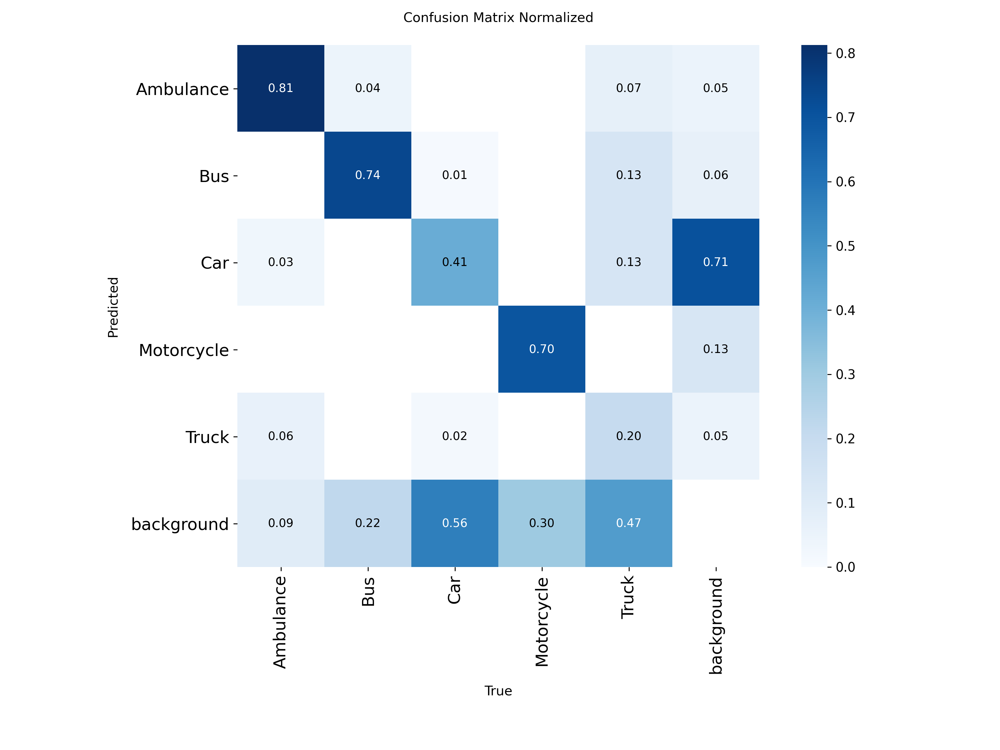

In [36]:
from IPython.display import Image, display
image_path = r"C:\Users\Kalivemula Rajendra\Desktop\chandini\runs\detect\train\confusion_matrix_normalized.png"
display(Image(filename=image_path))

In [ ]:
image_path = r'C:\Users\Kalivemula Rajendra\Desktop\chandini\runs\detect\train\F1_curve.png'
display(Image(filename=image_path))

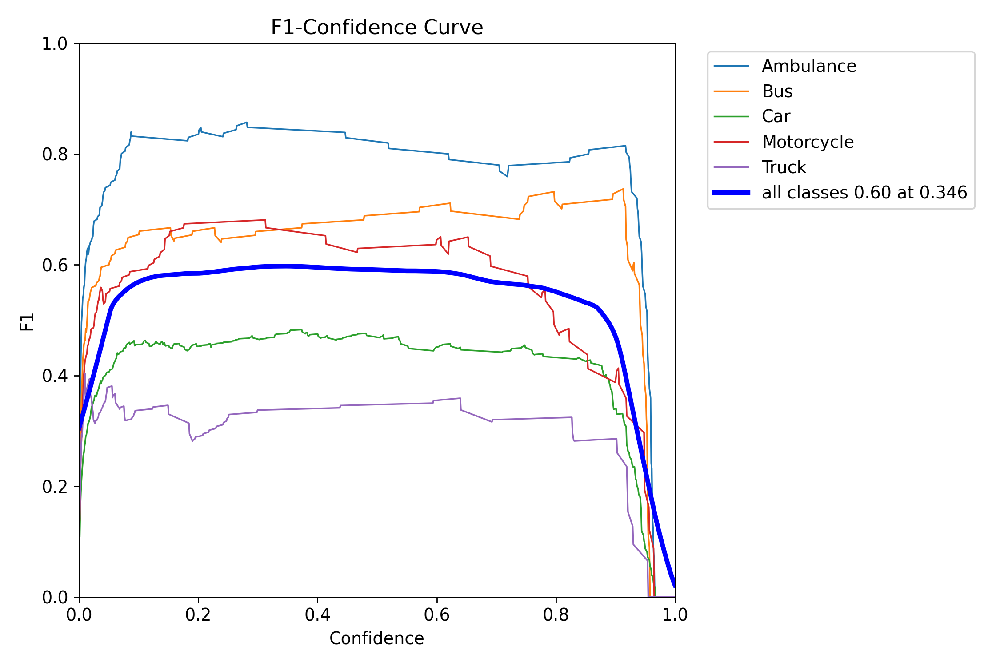

In [37]:
image_path = r"C:\Users\Kalivemula Rajendra\Desktop\chandini\runs\detect\train\F1_curve.png"
display(Image(filename=image_path))

In [38]:
best_model = YOLO(r"C:\Users\Kalivemula Rajendra\Desktop\chandini\runs\detect\train\weights\best.pt")
metrics = best_model.val(split = 'test')

Ultralytics 8.3.156  Python-3.9.21 torch-2.5.1 CUDA:0 (NVIDIA GeForce RTX 4060 Laptop GPU, 8188MiB)
YOLOv8n summary (fused): 72 layers, 3,006,623 parameters, 0 gradients, 8.1 GFLOPs
val: Fast image access  (ping: 0.20.1 ms, read: 3.71.0 MB/s, size: 26.1 KB)


val: Scanning C:\Users\Kalivemula Rajendra\Desktop\chandini\archive\VehiclesDetectionDataset\test\labels... 126 images, 0 backgrounds, 0 corrupt: 100%|██████████| 126/126 [00:00<00:00, 852.14it/s]

val: New cache created: C:\Users\Kalivemula Rajendra\Desktop\chandini\archive\VehiclesDetectionDataset\test\labels.cache



                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  5.41it/s]


                   all        126        258      0.776      0.636      0.696      0.538
             Ambulance         18         18      0.872          1      0.995      0.951
                   Bus         22         38      0.965      0.632       0.79      0.585
                   Car         60        150      0.638      0.563      0.633      0.427
            Motorcycle         12         32       0.67      0.438      0.446      0.216
                 Truck         14         20      0.733      0.549      0.615      0.512
Speed: 0.6ms preprocess, 4.4ms inference, 0.0ms loss, 2.0ms postprocess per image
Results saved to runs\detect\val


In [ ]:
from PIL import Image
image_dir = '/kaggle/input/vehicledetection/VehiclesDetectionDataset/test/images'
image_files = [os.path.join(image_dir, file) for file in os.listdir(image_dir) if file.endswith('.jpg')]
random_images = random.sample(image_files, k=10)
save_dir = '/kaggle/working/yolo_results'
os.makedirs(save_dir, exist_ok=True)
for image_path in random_images:
    image = Image.open(image_path).convert('RGB')
    image_np = cv2.cvtColor(np.array(image), cv2.COLOR_RGB2BGR)
    results = best_model.predict([image_np], save_dir=save_dir, imgsz=416, conf=0.5, iou=0.7)
    display(image)
    plot = results[0].plot()
    plot = cv2.cvtColor(plot, cv2.COLOR_BGR2RGB)
    display(Image.fromarray(plot))